# Fine-tuning with Dreambooth








## Installing the libraries

In [ ]:
!pip install lmdb

# !pip install torch==2.1.0+cu121 torchvision==0.16.0+cu121 torchaudio==2.1.0 torchtext==0.16.0+cpu torchdata==0.7.0 --index-url https://download.pytorch.org/whl/cu121

In [ ]:
!wget -q https://github.com/ShivamShrirao/diffusers/raw/main/examples/dreambooth/train_dreambooth.py
!wget -q https://github.com/ShivamShrirao/diffusers/raw/main/scripts/convert_diffusers_to_original_stable_diffusion.py


In [ ]:
%pip install -qq git+https://github.com/ShivamShrirao/diffusers
%pip install -q -U --pre triton
%pip install -q accelerate transformers ftfy bitsandbytes gradio natsort safetensors xformers

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


## Loading the model


> Terms of use

* https://huggingface.co/spaces/CompVis/stable-diffusion-license


In [ ]:
model_sd = "runwayml/stable-diffusion-v1-5"
output_dir = "/content/stable_diffusion_weights/zwx"

In [ ]:
!mkdir -p $output_dir

## Training

Three components are needed:
1. unique identifier
2. class name
3. images

Instance prompt
a photo of [unique identifier] [class name]

Class prompt
> a photo of [class name]

The instance prompt will be as follows:
> a photo of zwx road

As the subject is a road, the class prompt will be as follows:
> a photo of a road

In [ ]:
concepts_list = [
    {
        "instance_prompt": "zwx",
        "class_prompt": "photo of a road",
        "instance_data_dir": "/content/data/zwx",
        "class_data_dir": "/content/data/road"

    }
]

In [ ]:
import json
import os
import random

for c in concepts_list:
  os.makedirs(c["instance_data_dir"], exist_ok=True)

In [ ]:
with open("concepts_list.json", "w") as f:
  json.dump(concepts_list, f, indent=4)

### Parameters

In [ ]:
num_imgs = 15
num_class_images = num_imgs * 12
max_num_steps = 1000
learning_rate = 1e-6 # 0.0000001
lr_warmup_steps = int(max_num_steps / 15)
print(num_imgs, num_class_images, max_num_steps, learning_rate, lr_warmup_steps)

15 180 1000 1e-06 66


In [ ]:
!pip install "jax[cuda12_local]==0.4.23" -f https://storage.googleapis.com/jax-releases/jax_cuda_releases.html

Looking in links: https://storage.googleapis.com/jax-releases/jax_cuda_releases.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 131.8/131.8 MB 7.9 MB/s eta 0:00:00
  Attempting uninstall: jaxlib
    Found existing installation: jaxlib 0.4.26+cuda12.cudnn89
    Uninstalling jaxlib-0.4.26+cuda12.cudnn89:
      Successfully uninstalled jaxlib-0.4.26+cuda12.cudnn89
  Attempting uninstall: jax
    Found existing installation: jax 0.4.26
    Uninstalling jax-0.4.26:
      Successfully uninstalled jax-0.4.26


In [ ]:
!python3 train_dreambooth.py \
  --pretrained_model_name_or_path=$model_sd \
  --pretrained_vae_name_or_path="stabilityai/sd-vae-ft-mse" \
  --output_dir=$output_dir \
  --revision="fp16" \
  --with_prior_preservation --prior_loss_weight=1.0 \
  --seed=777 \
  --resolution=512 \
  --train_batch_size=1 \
  --train_text_encoder \
  --mixed_precision="fp16" \
  --use_8bit_adam \
  --gradient_accumulation_steps=1 \
  --learning_rate=$learning_rate \
  --lr_scheduler="constant" \
  --lr_warmup_steps=80 \
  --num_class_images=$num_class_images \
  --sample_batch_size=4 \
  --max_train_steps=$max_num_steps \
  --save_interval=10000 \
  --save_sample_prompt="zwx" \
  --concepts_list="concepts_list.json"

2024-05-17 02:22:16.474416: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-17 02:22:16.474502: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-17 02:22:16.615974: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [ ]:
from natsort import natsorted
from glob import glob
import os

weights_dir = natsorted(glob(output_dir + os.sep + '*'))[-1]
print('Weights directory: ', weights_dir)

Weights directory:  /content/stable_diffusion_weights/zwx/1000


In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image

def grid_img(imgs, rows=1, cols=3, scale=1):
  assert len(imgs) == rows * cols

  w, h = imgs[0].size
  w, h = int(w*scale), int(h*scale)

  grid = Image.new('RGB', size=(cols*w, rows*h))
  grid_w, grid_h = grid.size

  for i, img in enumerate(imgs):
      img = img.resize((w,h), Image.ANTIALIAS)
      grid.paste(img, box=(i%cols*w, i//cols*h))
  return grid

<ipython-input-21-61ea6e59baf2>:15: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((w,h), Image.ANTIALIAS)


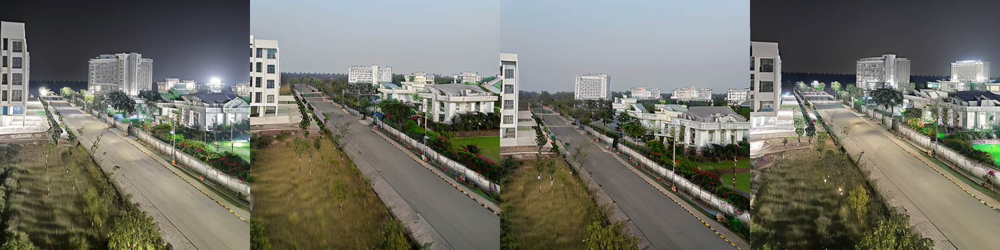

In [ ]:
import os
from PIL import Image

weights_folder = output_dir
folders = sorted([f for f in os.listdir(weights_folder) if f.isdigit() and f != "0"])

imgs_test = []

for folder in folders:
    folder_path = os.path.join(weights_folder, folder)
    image_folder = os.path.join(folder_path, "samples")
    images = [f for f in os.listdir(image_folder)]

    for i in images:
        img_path = os.path.join(image_folder, i)
        r = Image.open(img_path)
        imgs_test.append(r)

grid_img(imgs_test, rows=1, cols=4, scale=1)


## Convert the weights into (checkpoint)

In [ ]:
ckpt_path = weights_dir + "/model.ckpt"

half_arg = "--half" # fp16

!python convert_diffusers_to_original_stable_diffusion.py --model_path $weights_dir  --checkpoint_path $ckpt_path $half_arg
print(f"Converted to ckpt and saved in {ckpt_path}")

Reshaping encoder.mid.attn_1.q.weight for SD format
Reshaping encoder.mid.attn_1.k.weight for SD format
Reshaping encoder.mid.attn_1.v.weight for SD format
Reshaping encoder.mid.attn_1.proj_out.weight for SD format
Reshaping decoder.mid.attn_1.q.weight for SD format
Reshaping decoder.mid.attn_1.k.weight for SD format
Reshaping decoder.mid.attn_1.v.weight for SD format
Reshaping decoder.mid.attn_1.proj_out.weight for SD format
Converted to ckpt and saved in /content/stable_diffusion_weights/zwx/1000/model.ckpt


In [ ]:
# Download the model

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
from google.colab import auth
from googleapiclient.http import MediaFileUpload
from googleapiclient.discovery import build

auth.authenticate_user()

In [ ]:
drive_service = build('drive', 'v3')

def save_file_to_drive(name, path):
    file_metadata = {
        'name': name,
        'mimeType': 'application/octet-stream'
    }

    media = MediaFileUpload(path,
                            mimetype='application/octet-stream',
                            resumable=True)

    created = drive_service.files().create(body=file_metadata,
                                           media_body=media,
                                           fields='id').execute()

    print('File ID: {}'.format(created.get('id')))

    return created


In [ ]:
save_file_to_drive('model_weights.ckpt', '/content/stable_diffusion_weights/zwx/1000/model.ckpt')

ResumableUploadError: <HttpError 403 when requesting None returned "The user's Drive storage quota has been exceeded.". Details: "[{'message': "The user's Drive storage quota has been exceeded.", 'domain': 'usageLimits', 'reason': 'storageQuotaExceeded'}]">

## Inference (tests)

In [ ]:
import torch
from torch import autocast
from diffusers import StableDiffusionPipeline, DDIMScheduler
from IPython.display import display

In [ ]:
model_path = weights_dir
print(model_path)

/content/stable_diffusion_weights/zwx/1000


In [ ]:
pipe = StableDiffusionPipeline.from_pretrained(model_path, torch_dtype=torch.float16).to('cuda')

/usr/local/lib/python3.10/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [ ]:
pipe.scheduler = DDIMScheduler.from_config(pipe.scheduler.config)
pipe.enable_xformers_memory_efficient_attention()
seed = 778

## Generating images

Seed: 1207265211


  0%|          | 0/30 [00:00<?, ?it/s]

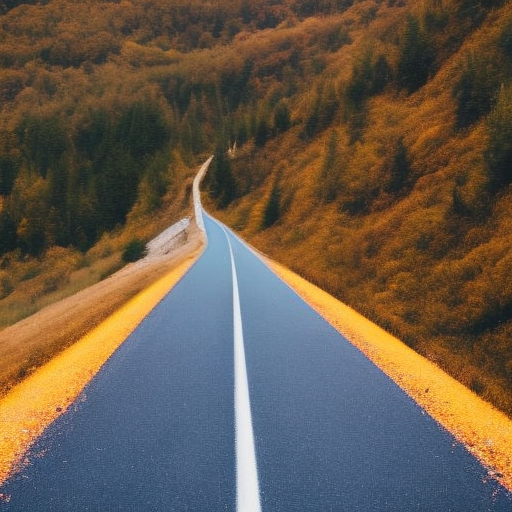

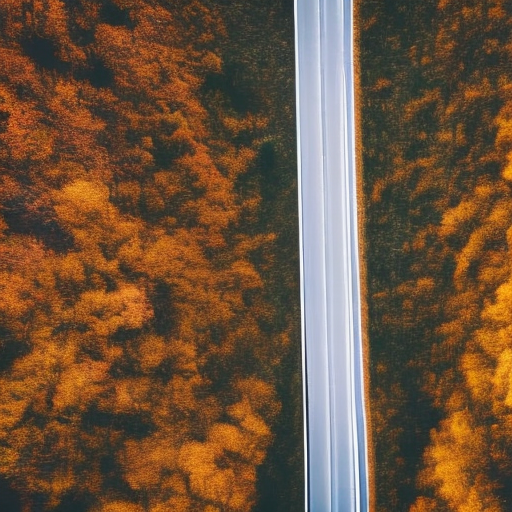

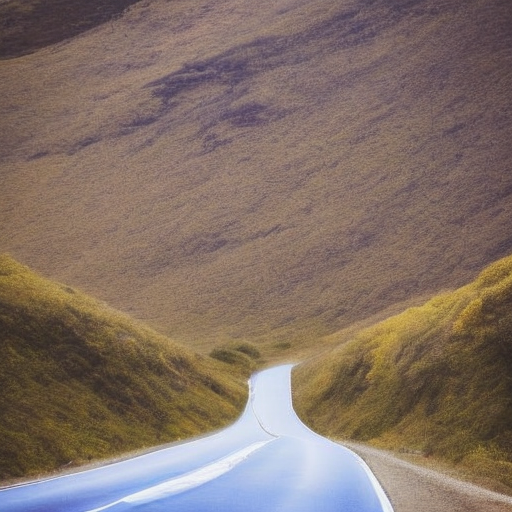

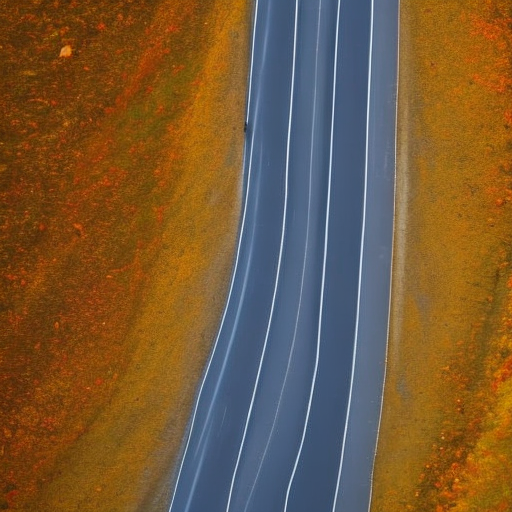

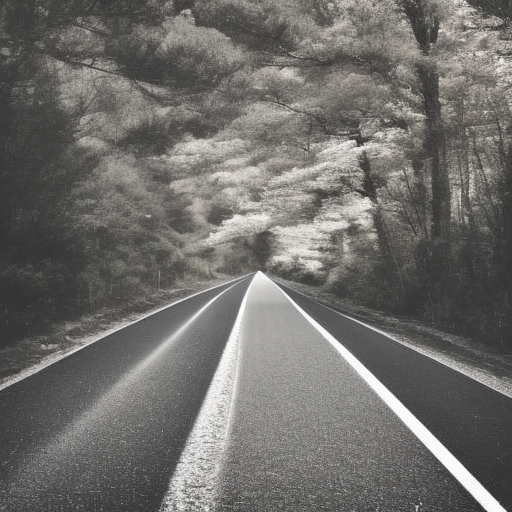

In [ ]:
# prompt = "portrait of zwx in the snow, realistic, hd, vivid, sunset"
# negative_prompt = "cartoon, unrealistic, blurry, low quality, low definition, lowres, out of frame, out of focus, tilted, distorted, painting, sketch, drawing, water, people, animals, vehicles, traffic lights, signs, buildings, sky, grass, sunset, sunrise, night, indoors, blurred motion"
prompt = "photo of road"

num_samples = 5
guidance_scale = 7.5
num_inference_steps = 30
height = 512
width = 512

seed = random.randint(0, 2147483647)
print("Seed: {}".format(str(seed)))
generator = torch.Generator(device='cuda').manual_seed(seed)

with autocast("cuda"), torch.inference_mode():
    imgs = pipe(
        prompt,
        # negative_prompt=negative_prompt,
        height=height, width=width,
        num_images_per_prompt=num_samples,
        num_inference_steps=num_inference_steps,
        guidance_scale=guidance_scale,
        generator=generator
    ).images

for img in imgs:
    display(img)

Seed: 773516110


  0%|          | 0/30 [00:00<?, ?it/s]

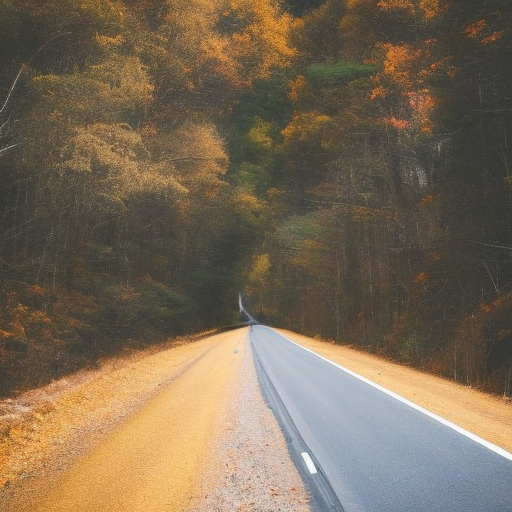

  0%|          | 0/30 [00:00<?, ?it/s]

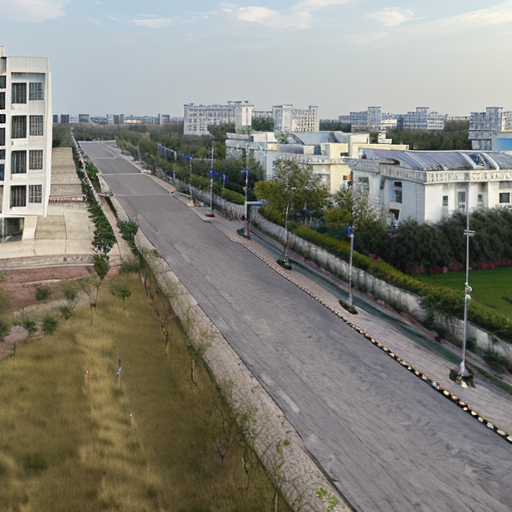

  0%|          | 0/30 [00:00<?, ?it/s]

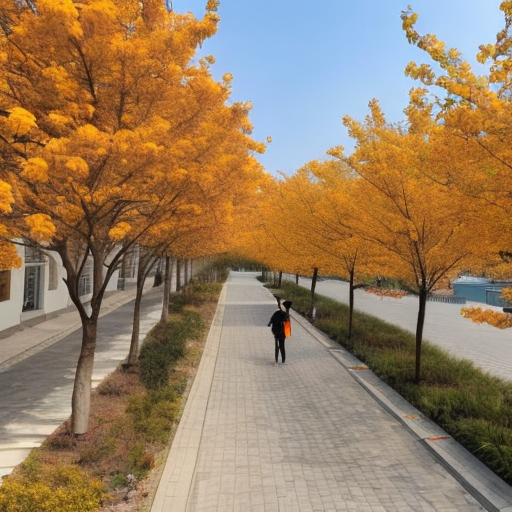

  0%|          | 0/30 [00:00<?, ?it/s]

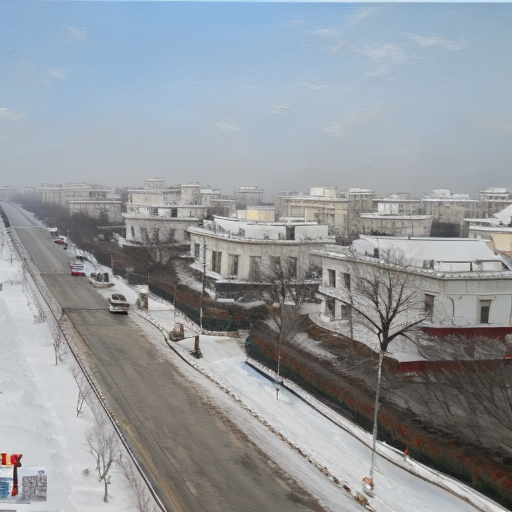

In [ ]:
prompt_list = ["photo of road", "van gogh painting of zwx road", "photo of zwx in autumn in newyork with orange trees", "oil painting of zwx road in snow"]
negative_prompt_list = ["cartoon", "unrealistic", "blurry", "low quality", "low definition", "lowres", "out of frame", "out of focus", "tilted", "distorted", "painting", "sketch", "drawing", "water", "people", "animals", "vehicles", "traffic lights", "signs", "buildings", "sky", "grass", "sunset", "sunrise", "night", "indoors", "blurred motion"]

num_samples = 1
guidance_scale = 7.5
num_inference_steps = 30
height = 512
width = 512

seed = random.randint(0, 2147483647)
print("Seed: {}".format(str(seed)))
generator = torch.Generator(device='cuda').manual_seed(seed)

for prompt, negative_prompt in zip(prompt_list, negative_prompt_list):
    with autocast("cuda"), torch.inference_mode():
        imgs = pipe(
            prompt,
            negative_prompt=negative_prompt,
            height=height, width=width,
            num_images_per_prompt=num_samples,
            num_inference_steps=num_inference_steps,
            guidance_scale=guidance_scale,
            generator=generator
        ).images

    for img in imgs:
        display(img)


Seed: 91581692


  0%|          | 0/30 [00:00<?, ?it/s]

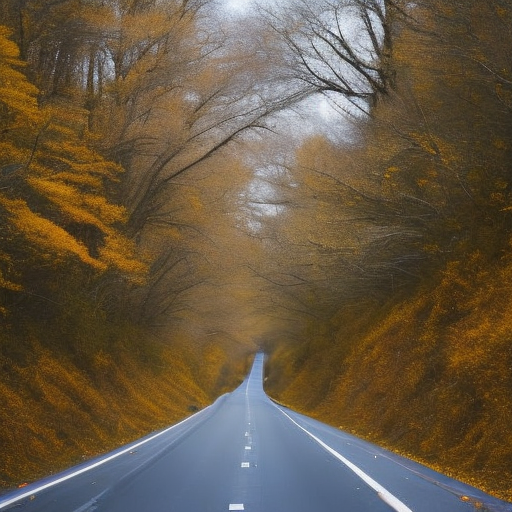

  0%|          | 0/30 [00:00<?, ?it/s]

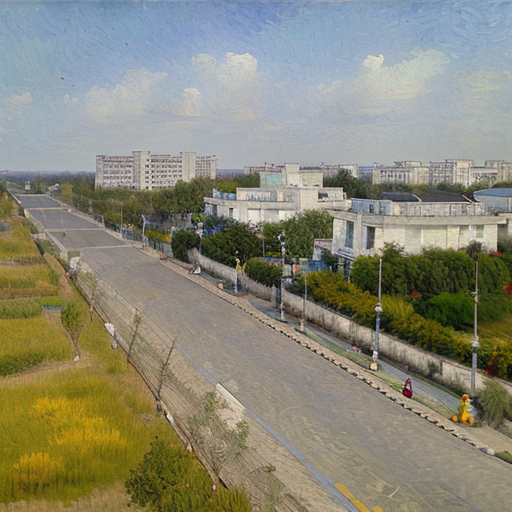

  0%|          | 0/30 [00:00<?, ?it/s]

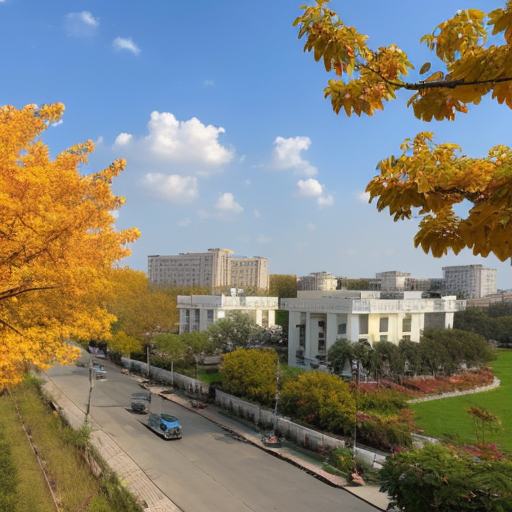

  0%|          | 0/30 [00:00<?, ?it/s]

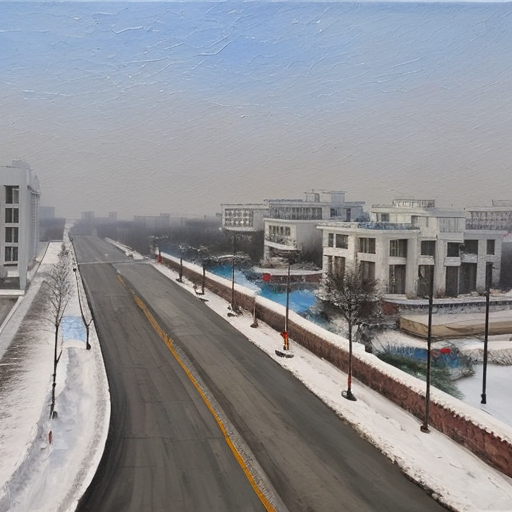

In [ ]:
#more prompt engineering

prompt = ["photo of zwx, surrounded by high rise buildings,closeup, mountain fuji in the background, natural lighting",
          "photo of zwx, oil painting, indescent gold,unreal engines, closeup, pyramids in the background, natural lighting, frontal face",
          "photo of zwx,pop art,highly detailed, natural lighting, frontal face",
          "photo of zwx  with huge croud of dogs there, natural lighting, frontal face, closeup, starry sky in the background,hd",
          "portrait of zwx in the snow, realistic, hd, vivid, sunset"]
negative_prompt_list = ["cartoon", "unrealistic", "blurry", "low quality", "low definition", "lowres", "out of frame", "out of focus", "tilted", "distorted", "painting", "sketch", "drawing", "water", "people", "animals", "vehicles", "traffic lights", "signs", "buildings", "sky", "grass", "sunset", "sunrise", "night", "indoors", "blurred motion"]

num_samples = 1
guidance_scale = 7.5
num_inference_steps = 30
height = 512
width = 512

seed = random.randint(0, 2147483647)
print("Seed: {}".format(str(seed)))
generator = torch.Generator(device='cuda').manual_seed(seed)

for prompt, negative_prompt in zip(prompt_list, negative_prompt_list):
    with autocast("cuda"), torch.inference_mode():
        imgs = pipe(
            prompt,
            negative_prompt=negative_prompt,
            height=height, width=width,
            num_images_per_prompt=num_samples,
            num_inference_steps=num_inference_steps,
            guidance_scale=guidance_scale,
            generator=generator
        ).images

    for img in imgs:
        display(img)


Seed: 1814426194


  0%|          | 0/30 [00:00<?, ?it/s]

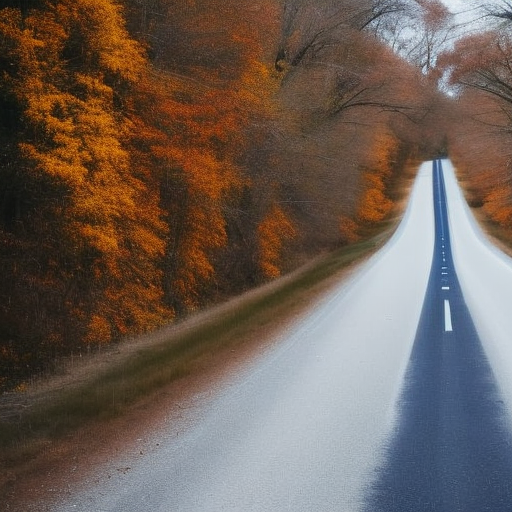

  0%|          | 0/30 [00:00<?, ?it/s]

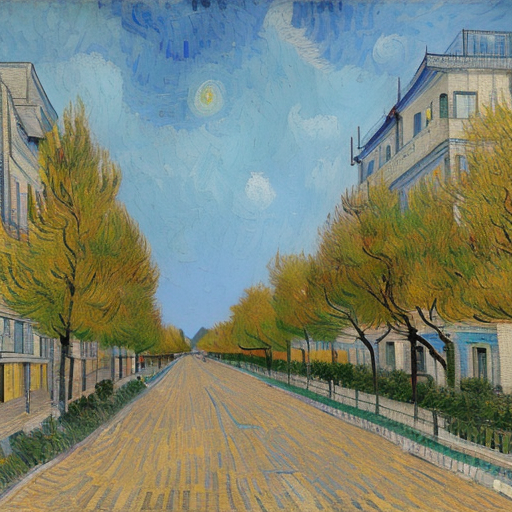

  0%|          | 0/30 [00:00<?, ?it/s]

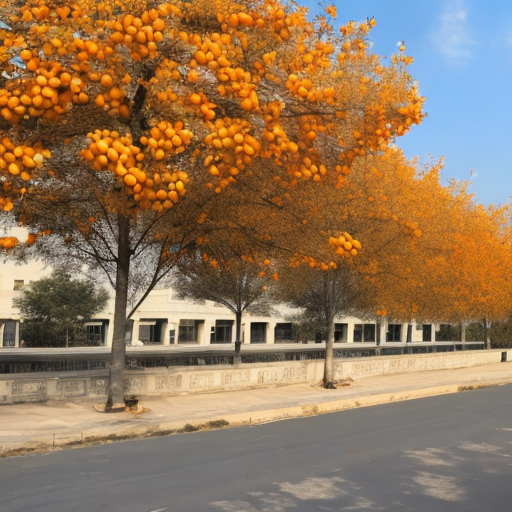

  0%|          | 0/30 [00:00<?, ?it/s]

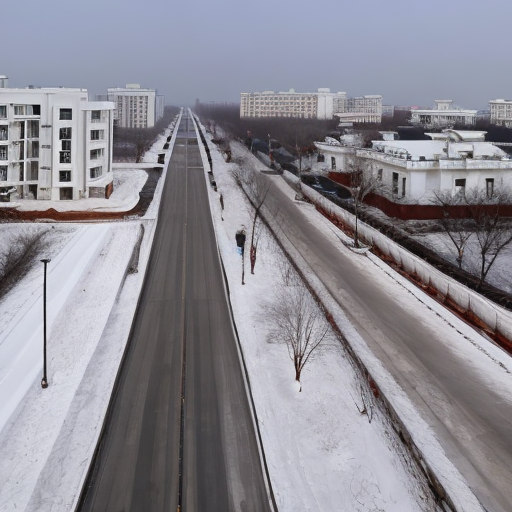

In [ ]:
#more prompt engineering

prompt = ["photo of zwx, oil painting, indescent gold,unreal engines, closeup, pyramids in the background, natural lighting, frontal face",
          "photo of zwx,pop art,highly detailed, natural lighting, frontal face",
          "photo of zwx,van gogh, natural lighting, frontal face, closeup, starry sky in the background,hd",
          "photo of zwx,rembrandt, natural lighting, frontal face, closeup, starry sky in the background,hd",
          "portrait of zwx in the snow, realistic, hd, vivid, sunset"]
negative_prompt_list = ["cartoon", "unrealistic", "blurry", "low quality", "low definition", "lowres", "out of frame", "out of focus", "tilted", "distorted", "painting", "sketch", "drawing", "water", "people", "animals", "vehicles", "traffic lights", "signs", "buildings", "sky", "grass", "sunset", "sunrise", "night", "indoors", "blurred motion"]

num_samples = 1
guidance_scale = 7.5
num_inference_steps = 30
height = 512
width = 512

seed = random.randint(0, 2147483647)
print("Seed: {}".format(str(seed)))
generator = torch.Generator(device='cuda').manual_seed(seed)

for prompt, negative_prompt in zip(prompt_list, negative_prompt_list):
    with autocast("cuda"), torch.inference_mode():
        imgs = pipe(
            prompt,
            negative_prompt=negative_prompt,
            height=height, width=width,
            num_images_per_prompt=num_samples,
            num_inference_steps=num_inference_steps,
            guidance_scale=guidance_scale,
            generator=generator
        ).images

    for img in imgs:
        display(img)

Seed: 1746251647


  0%|          | 0/30 [00:00<?, ?it/s]

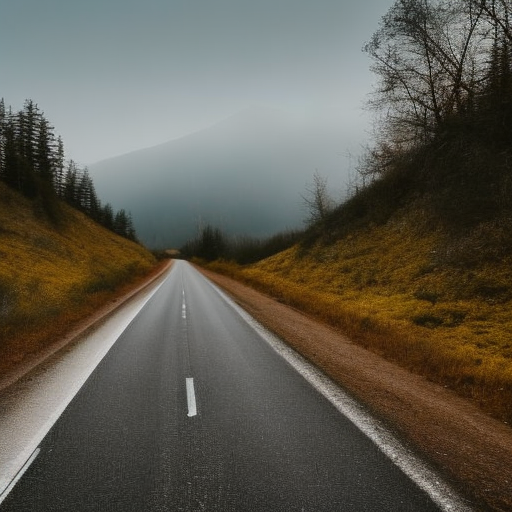

  0%|          | 0/30 [00:00<?, ?it/s]

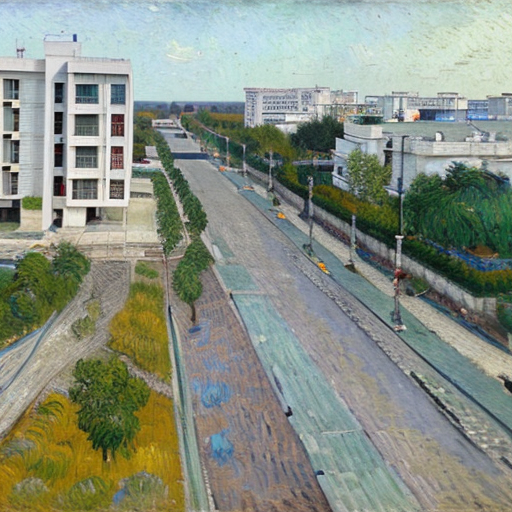

  0%|          | 0/30 [00:00<?, ?it/s]

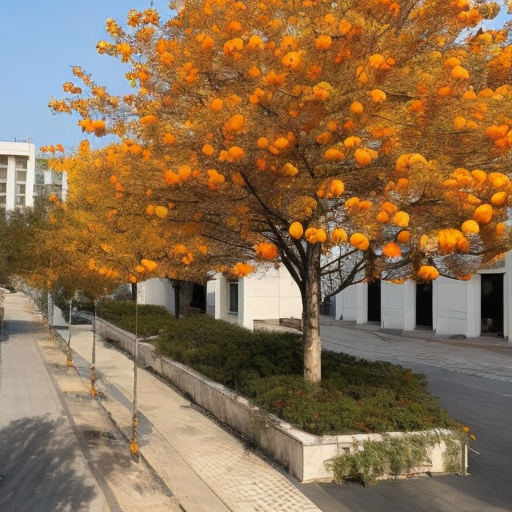

  0%|          | 0/30 [00:00<?, ?it/s]

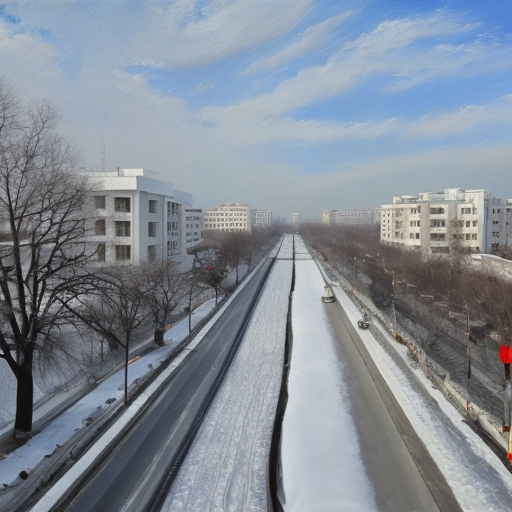

In [ ]:
#more prompt engineering


prompt = ["portrait of zwx in the snow,pixabay, realistic, hd, vivid, sunset","portrait of zwx in the snow,unspalsh, realistic, hd, vivid, sunset"]
negative_prompt_list = ["cartoon", "unrealistic", "blurry", "low quality", "low definition", "lowres", "out of frame", "out of focus", "tilted", "distorted", "painting", "sketch", "drawing", "water", "people", "animals", "vehicles", "traffic lights", "signs", "buildings", "sky", "grass", "sunset", "sunrise", "night", "indoors", "blurred motion"]

num_samples = 1
guidance_scale = 7.5
num_inference_steps = 30
height = 512
width = 512

seed = random.randint(0, 2147483647)
print("Seed: {}".format(str(seed)))
generator = torch.Generator(device='cuda').manual_seed(seed)

for prompt, negative_prompt in zip(prompt_list, negative_prompt_list):
    with autocast("cuda"), torch.inference_mode():
        imgs = pipe(
            prompt,
            negative_prompt=negative_prompt,
            height=height, width=width,
            num_images_per_prompt=num_samples,
            num_inference_steps=num_inference_steps,
            guidance_scale=guidance_scale,
            generator=generator
        ).images

    for img in imgs:
        display(img)

Seed: 222432631


  0%|          | 0/30 [00:00<?, ?it/s]

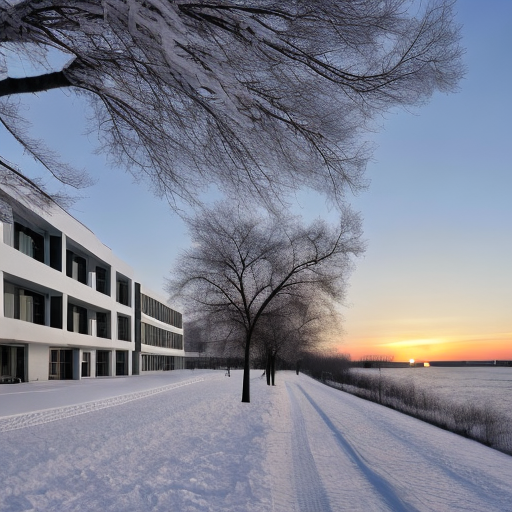

  0%|          | 0/30 [00:00<?, ?it/s]

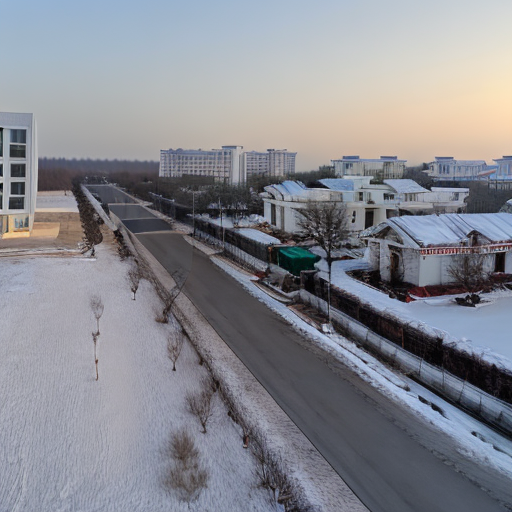

In [ ]:
prompt_list_3 = ["portrait of zwx in the snow,pixabay, realistic, hd, vivid, sunset","portrait of zwx in the snow,unspalsh, realistic, hd, vivid, sunset"]
negative_prompt_list_3 = ["cartoon", "unrealistic", "blurry", "low quality", "low definition", "lowres", "out of frame", "out of focus", "tilted", "distorted", "painting", "sketch", "drawing", "water", "people", "animals", "vehicles", "traffic lights", "signs", "buildings", "sky", "grass", "sunset", "sunrise", "night", "indoors", "blurred motion"]

num_samples = 1
guidance_scale = 7.5
num_inference_steps = 30
height = 512
width = 512

seed = random.randint(0, 2147483647)
print("Seed: {}".format(str(seed)))
generator = torch.Generator(device='cuda').manual_seed(seed)

for prompt, negative_prompt in zip(prompt_list_3, negative_prompt_list_3):
    with autocast("cuda"), torch.inference_mode():
        imgs = pipe(
            prompt,
            negative_prompt=negative_prompt,
            height=height, width=width,
            num_images_per_prompt=num_samples,
            num_inference_steps=num_inference_steps,
            guidance_scale=guidance_scale,
            generator=generator
        ).images

    for img in imgs:
        display(img)


In [ ]:
!pip install -q datasets diffusers transformers accelerate torchmetrics[image]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 510.5/510.5 kB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 841.5/841.5 kB 13.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 19.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 14.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 20.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.5/755.5 MB 2.2 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
xformers 0.0.25.post1 requires torch==2.2.2, but you have torch 2.2.1 which is incompatible.


In [ ]:
from natsort import natsorted
from glob import glob
import os

# Find the latest weights directory (assuming weights are saved with timestamps or version numbers)
weights_dir = natsorted(glob(output_dir + os.sep + '*'))[-1]
print('Weights directory: ', weights_dir)

# Function to create an image grid for visualization (optional)
import matplotlib.pyplot as plt
from PIL import Image

def grid_img(imgs, rows=1, cols=3, scale=1):
  assert len(imgs) == rows * cols

  w, h = imgs[0].size
  w, h = int(w*scale), int(h*scale)

  grid = Image.new('RGB', size=(cols*w, rows*h))
  grid_w, grid_h = grid.size

  for i, img in enumerate(imgs):
    img = img.resize((w,h), Image.ANTIALIAS)
    grid.paste(img, box=(i%cols*w, i//cols*h))
  return grid

# Function to load images from a folder
import os
from PIL import Image

def load_images_from_folder(folder_path):
  images = []
  for image_file in os.listdir(folder_path):
    img_path = os.path.join(folder_path, image_file)
    images.append(Image.open(img_path))
  return images

# Load your custom Stable Diffusion model
model_path = weights_dir + "/model.ckpt"
print(f"Model path: {model_path}")

import torch
from torch import autocast
from diffusers import StableDiffusionPipeline, DDIMScheduler
from IPython.display import display

# Load the pipeline with your model and enable memory efficiency
pipe = StableDiffusionPipeline.from_pretrained(model_path, torch_dtype=torch.float16).to('cuda')
pipe.scheduler = DDIMScheduler.from_config(pipe.scheduler.config)
pipe.enable_xformers_memory_efficient_attention()

# Define a random seed for reproducibility (optional)
seed = random.randint(0, 2147483647)
print("Seed: {}".format(str(seed)))
generator = torch.Generator(device='cuda').manual_seed(seed)

# Define prompts, image size, and other generation parameters
prompt = "photo of a road"  # Replace with your desired prompt(s)
# negative_prompt = "cartoon, unrealistic, blurry, ..."  # Optional negative prompt
num_samples = 5
guidance_scale = 7.5
num_inference_steps = 30
height = 512
width = 512

# Generate images using the defined pipeline
with autocast("cuda"), torch.inference_mode():
  imgs = pipe(
      prompt,
      # negative_prompt=negative_prompt,  # Uncomment if using negative prompt
      height=height, width=width,
      num_images_per_prompt=num_samples,
      num_inference_steps=num_inference_steps,
      guidance_scale=guidance_scale,
      generator=generator
  ).images

# Calculate CLIP score to evaluate image-text alignment
from torchmetrics.functional.multimodal import clip_score
from functools import partial

clip_score_fn = partial(clip_score, model_name_or_path="openai/clip-vit-base-patch16")


def calculate_clip_score(images, prompts):
  images_int = (images * 255).astype("uint8")
  clip_score = clip_score_fn(torch.from_numpy(images_int).permute(0, 3, 1, 2), prompts).detach()
  return round(float(clip_score), 4)


sd_clip_score = calculate_clip_score(imgs, [prompt])
print(f"CLIP score for '{prompt}': {sd_clip_score}")

# Optional visualization: Display generated images in a grid
# grid_img(imgs, rows=2, cols=3)  # Adjust rows and cols as needed
# display(grid_img(imgs, rows=2, cols=3))  # Uncomment to display the grid


In [ ]:
from datasets import load_dataset

# prompts = load_dataset("nateraw/parti-prompts", split="train")
# prompts = prompts.shuffle()
# sample_prompts = [prompts[i]["Prompt"] for i in range(5)]

# Fixing these sample prompts in the interest of reproducibility.
prompt = ["photo of zwx, surrounded by high rise buildings,closeup, mountain fuji in the background, natural lighting",
          "photo of zwx in the desert, closeup, pyramids in the background, natural lighting, frontal face",
          "photo of zwx  in the forest, natural lighting, frontal face",
          "photo of zwx  with huge croud of dogs there, natural lighting, frontal face, closeup, starry sky in the background",
          "portrait of zwx in the snow, realistic, hd, vivid, sunset"]

In [ ]:
from diffusers import StableDiffusionPipeline
import torch

model_ckpt = "runwayml/stable-diffusion-v1-5"
weight_dtype = torch.float16
sd_pipeline = StableDiffusionPipeline.from_pretrained(model_ckpt, torch_dtypr = weight_dtype).to('cuda')

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Keyword arguments {'torch_dtypr': torch.float16} are not expected by StableDiffusionPipeline and will be ignored.


In [ ]:
seed = 0
generator = torch.manual_seed(seed)

images = sd_pipeline(prompt, num_images_per_prompt=1, generator=generator, output_type="numpy"
).images
images

  0%|          | 0/50 [00:00<?, ?it/s]

array([[[[0.5310955 , 0.57443213, 0.65072095],
         [0.5385352 , 0.57289594, 0.6700294 ],
         [0.53130597, 0.5724681 , 0.6746458 ],
         ...,
         [0.4565144 , 0.5401949 , 0.69747925],
         [0.45830444, 0.538293  , 0.7065383 ],
         [0.46872228, 0.54419386, 0.6874136 ]],

        [[0.5250729 , 0.56723654, 0.6668914 ],
         [0.5327928 , 0.5670096 , 0.6780814 ],
         [0.52644855, 0.5655385 , 0.6706508 ],
         ...,
         [0.46490514, 0.5367641 , 0.6967763 ],
         [0.46780062, 0.53776646, 0.7019797 ],
         [0.45453215, 0.53149605, 0.70599246]],

        [[0.52737427, 0.56582487, 0.67306834],
         [0.5267947 , 0.5677479 , 0.67649925],
         [0.5264133 , 0.5707062 , 0.6733383 ],
         ...,
         [0.4700836 , 0.5385381 , 0.6974565 ],
         [0.47238168, 0.5432934 , 0.69875515],
         [0.46250698, 0.5408575 , 0.701824  ]],

        ...,

        [[0.13767165, 0.16409084, 0.03648046],
         [0.15059045, 0.18273178, 0.04748318]

Quantitaive Evaluation


In [ ]:
prompt = ["photo of zwx, surrounded by high rise buildings,closeup, mountain fuji in the background, natural lighting",
          "photo of zwx in the desert, closeup, pyramids in the background, natural lighting, frontal face",
          "photo of zwx  in the forest, natural lighting, frontal face",
          "photo of zwx  with huge croud of dogs there, natural lighting, frontal face, closeup, starry sky in the background",
          "portrait of zwx in the snow, realistic, hd, vivid, sunset"]


images = sd_pipeline(prompt, num_images_per_prompt=1, generator=generator, output_type="numpy"
).images

  0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
print(images.shape)

(5, 512, 512, 3)


In [ ]:
from torchmetrics.functional.multimodal import clip_score
from functools import partial

clip_score_fn = partial(clip_score, model_name_or_path="openai/clip-vit-base-patch16")


def calculate_clip_score(images, prompts):
    images_int = (images * 255).astype("uint8")
    clip_score = clip_score_fn(torch.from_numpy(images_int).permute(0, 3, 1, 2), prompts).detach()
    return round(float(clip_score), 4)


sd_clip_score = calculate_clip_score(images, prompt)
print(f"CLIP score: {sd_clip_score}")

config.json:   0%|          | 0.00/4.10k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/599M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/905 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/961k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

CLIP score: 32.3034


In [ ]:
# compare two checkpoints compatible

seed = 0
generator = torch.manual_seed(seed)

images = sd_pipeline(prompt, num_images_per_prompt = 1,generator = generator, output_type = "numpy").images

  0%|          | 0/50 [00:00<?, ?it/s]

### Testing multiple prompts

## Saving the results

In [ ]:
!mkdir results

In [ ]:
for i, img in enumerate(imgs):
  img.save('results/result_{}.png'.format(i+1))